# Moderna's Stock Price, Twitter and Sentiment Analysis

### Web Analytics Final Project

***
Moderna's Stock Prices: https://drive.google.com/file/d/1Tm7Ao0liyZ8MH3gLMElz7QwfiBoCQZnr/view?usp=sharing

Positive Tweets Before Spike: https://drive.google.com/file/d/15EUs6CuqDKsU6y8Y4yTgUoW9j7biOb3M/view?usp=sharing

Positive Tweets After Spike: https://drive.google.com/file/d/1J57htDWwqSwjVy8iRU27y5dNVrz1kFx1/view?usp=sharing

Negative Tweets Before Dip: https://drive.google.com/file/d/1jOeY1YRUpqdi3CVeYZ49JUQF8rQbZ2hs/view?usp=sharing

Negative Tweets After Dip: https://drive.google.com/file/d/1yHVBWFT4jxFzZRXnTZr1sZxzJqh4Oqed/view?usp=sharing

In [1]:
import re
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()

import time
import datetime as dt
from bs4 import BeautifulSoup
from selenium import webdriver
from selenium.common.exceptions import NoSuchElementException
from selenium.webdriver.common.keys import Keys
from datetime import date, timedelta

import snscrape.modules.twitter as sntwitter
import itertools

import string
import nltk
nltk.download('vader_lexicon')
from nltk.stem.porter import *
from nltk.tokenize import TweetTokenizer
from wordcloud import WordCloud
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning)
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize

#import Stemmer 
from nltk.stem.snowball import SnowballStemmer
# Use English stemmer.
stemmer = SnowballStemmer("english")
from sacremoses import MosesTokenizer, MosesDetokenizer
from textblob import TextBlob
import plotly.express as px

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Irene\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


### Importing Moderna Dataset

In [2]:
# read the Moderna.csv file and display the contents
#filepath = "/Users/vicky/Desktop/Web Analytics/MRNA.stockprices.csv"
moderna = pd.read_csv('MRNA.stockprices.csv')
moderna.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
726,11/17/2021,234.789993,249.139999,234.570007,242.229996,242.229996,8015800
727,11/18/2021,246.119995,253.190002,243.789993,251.410004,251.410004,7395600
728,11/19/2021,265.415009,274.839996,258.089996,263.779999,263.779999,15606700
729,11/22/2021,268.070007,289.000000,264.200012,282.690002,282.690002,13852800
730,11/23/2021,277.739990,281.980011,269.179993,276.380005,276.380005,6900200


In [3]:
## turning date into datetime so we can utilize the datetime in our twitter search/scraping
moderna['Datetime'] = pd.to_datetime(moderna['Date'])
moderna = moderna.set_index('Datetime')
## getting rid of unnecceasry columns from dataset
moderna = moderna.drop(columns = ['High', 'Low', 'Adj Close', 'Volume', 'Date'])
moderna_columns = ['open', 'close']
moderna.columns = moderna_columns
moderna.tail()

,open,close
Datetime,,
2021-11-17,234.789993,242.229996
2021-11-18,246.119995,251.410004
2021-11-19,265.415009,263.779999
2021-11-22,268.070007,282.690002
2021-11-23,277.739990,276.380005


### Checking Dataset

In [4]:
moderna.info() #731 entries

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 731 entries, 2019-01-02 to 2021-11-23
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   open    731 non-null    float64
 1   close   731 non-null    float64
dtypes: float64(2)
memory usage: 17.1 KB


In [5]:
moderna.isna().sum() #checking to see if there are any missing values in the dataset

open     0
close    0
dtype: int64

In [6]:
moderna.describe()

,open,close
count,731.000000,731.000000
mean,102.870153,103.274596
std,112.962125,113.691280
min,12.260000,12.260000
25%,19.625000,19.610000
50%,62.355000,62.080002
75%,151.279999,153.775002
max,485.500000,484.470001


### Moderna Closing Price Visual

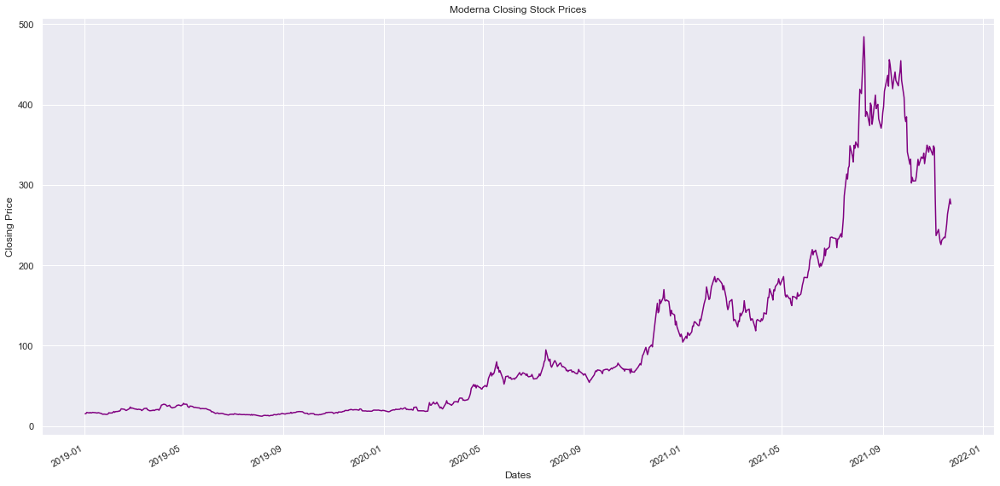

In [8]:
#charting opening stock price over the years for Moderna
moderna['close'].plot(figsize=(20,10), color='purple', title='Moderna Closing Stock Prices')
plt.xlabel('Dates')
plt.ylabel('Closing Price');

### Percent Change Column

In [9]:
moderna['mod_pct_change'] = ((moderna['close'] - moderna['close'].shift())/moderna['close'])*100
mean1 = moderna.mod_pct_change.mean()

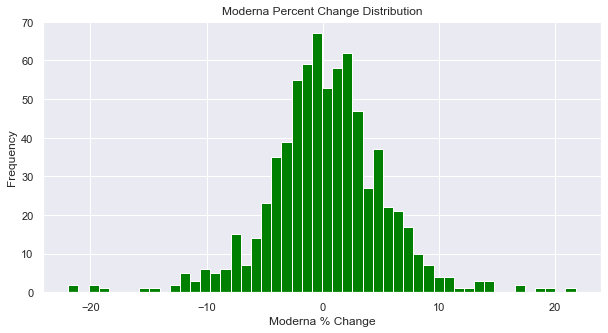

In [10]:
moderna['mod_pct_change'].plot(bins = 50, figsize=(10,5), color = 'green', kind = "hist", title = "Moderna Percent Change Distribution");
plt.xlabel('Moderna % Change');

#### Moderna Positive Percent Change

In [11]:
pos_filter = (moderna.mod_pct_change > mean1)
largest_pct_stock_change = moderna[pos_filter]
pos_mod = largest_pct_stock_change.nlargest(10,['mod_pct_change'])
pos_mod

,open,close,mod_pct_change
Datetime,,,
2020-02-25,22.150000,23.760000,21.759259
2020-03-16,23.760000,26.490000,19.592303
2020-02-26,29.049999,29.160000,18.518519
2020-11-30,144.000000,152.740005,16.832529
2020-05-18,86.139999,80.000000,16.637497
2021-08-09,411.300995,484.470001,14.603587
2020-02-07,19.790001,23.240000,14.457836
2020-11-27,115.120003,127.029999,14.051798
2020-07-17,83.349998,94.849998,13.748023


#### Moderna Negative Percent Change

In [12]:
neg_filter = (moderna.mod_pct_change < mean1)
negative_pct_stock_change = moderna[neg_filter]
neg_mod = negative_pct_stock_change.nsmallest(10,['mod_pct_change'])
neg_mod

,open,close,mod_pct_change
Datetime,,,
2020-03-09,30.000000,24.290001,-21.902016
2021-11-04,295.809998,284.019989,-21.794249
2021-11-05,241.570007,236.990005,-19.844712
2020-05-26,66.400002,57.709999,-19.563336
2021-08-11,443.570007,385.329987,-18.537364
2020-09-08,57.750000,54.340000,-15.200585
2020-07-20,87.860001,82.680000,-14.719398
2021-10-01,358.329987,341.089996,-12.832387
2020-02-12,19.639999,19.010000,-12.309311


#### Moderna Positive Dictionary

In [13]:
moderna_pos_dict = pos_mod['mod_pct_change'].to_dict()
moderna_pos_dict

{Timestamp('2020-02-25 00:00:00'): 21.759259259259263,
 Timestamp('2020-03-16 00:00:00'): 19.592302755756887,
 Timestamp('2020-02-26 00:00:00'): 18.518518518518515,
 Timestamp('2020-11-30 00:00:00'): 16.832529238165204,
 Timestamp('2020-05-18 00:00:00'): 16.63749749999999,
 Timestamp('2021-08-09 00:00:00'): 14.603587395290548,
 Timestamp('2020-02-07 00:00:00'): 14.457835628227182,
 Timestamp('2020-11-27 00:00:00'): 14.051798111090275,
 Timestamp('2020-07-17 00:00:00'): 13.74802348440746,
 Timestamp('2020-04-17 00:00:00'): 13.340448808557046}

#### Moderna Negative Dictionary

In [14]:
moderna_neg_dict = neg_mod['mod_pct_change'].to_dict()
moderna_neg_dict

{Timestamp('2020-03-09 00:00:00'): -21.90201638937767,
 Timestamp('2021-11-04 00:00:00'): -21.79424913645778,
 Timestamp('2021-11-05 00:00:00'): -19.844712016441374,
 Timestamp('2020-05-26 00:00:00'): -19.56333598272978,
 Timestamp('2021-08-11 00:00:00'): -18.537364183909208,
 Timestamp('2020-09-08 00:00:00'): -15.200585204269407,
 Timestamp('2020-07-20 00:00:00'): -14.719397677793895,
 Timestamp('2021-10-01 00:00:00'): -12.83238720375722,
 Timestamp('2020-02-12 00:00:00'): -12.309310889005785,
 Timestamp('2021-03-03 00:00:00'): -11.880808475226281}

###  Article Scraping

In [15]:
moderna_neg_list = list(moderna_neg_dict.keys())
moderna_pos_list = list(moderna_pos_dict.keys())

In [85]:
import datetime
dates = []
original_dates = []
stock_dates = []

for date in moderna_pos_list:
    after_date = date + timedelta(1)
    before_date = date - timedelta(1)
    dates.append(before_date)
    dates.append(date)
    dates.append(after_date)

for date in moderna_neg_list:
    after_date = date + timedelta(1)
    before_date = date - timedelta(1)
    dates.append(before_date)
    dates.append(date)
    dates.append(after_date)
    
for date in dates:
    date = str(date)
    date_clean = date[0:10]
    date_original = datetime.datetime.strptime(date_clean, "%Y-%m-%d")
    full_date = date_original.strftime("%B %#d, %Y")
    stock_dates.append(full_date)
    
for x in range(1, len(stock_dates), 3):
    original_dates.append(stock_dates[x])

In [19]:
# set page and path
page = 'https://investors.modernatx.com/news/default.aspx'

path = "chromedriver"
#path = "C:\Program Files\Google\Chrome\Application\chromedriver"
browser = webdriver.Chrome(path)
browser.get(page)

# a helper function to check if the button exists on the page
def check_exists_by_xpath(xpath):
    try:
        browser.find_element_by_xpath(xpath)
    except NoSuchElementException:
        return False
    return True

In [20]:
# collect list of article dates and headlines
article_dates = []
article_headlines = []
pageNum = 2
    
for i in range(0, pageNum):
    
    # parse to a soup
    page_source = browser.page_source
    soup = BeautifulSoup(page_source, 'lxml')
    article_content = soup.find_all('div', class_='module_item')
    
    # extract the date and headline of all articles under 'News' 
    for article in article_content:
        try:
            d = article.find('div')
            date = d.get_text(strip=True).replace('\xa0', ' ')
        
            title = article.find('a')
            headline = title.get_text(strip=True).replace('\xa0', ' ')
        except:
            date = NA
            headline = none

        # append to our accumulative lists
        article_dates.append(date)
        article_headlines.append(headline)
    
    # use selenium to go to 2020 news page, default is 2021
    if (check_exists_by_xpath('//select[@class="dropdown module_options-select module_options-year"]')):
        browser.find_element_by_xpath('//select[@class="dropdown module_options-select module_options-year"]').click()
        browser.find_element_by_xpath('//option[@value="2020"]').click()
        time.sleep(1)
        
# close the browser
browser.quit()

In [115]:
article_dates    

['December 13, 2021',
 'December 10, 2021',
 'December 10, 2021',
 'December 9, 2021',
 'December 9, 2021',
 'December 1, 2021',
 'November 26, 2021',
 'November 22, 2021',
 'November 19, 2021',
 'November 19, 2021',
 'November 18, 2021',
 'November 17, 2021',
 'November 17, 2021',
 'November 16, 2021',
 'November 15, 2021',
 'November 15, 2021',
 'November 12, 2021',
 'November 9, 2021',
 'November 4, 2021',
 'November 2, 2021',
 'November 1, 2021',
 'October 31, 2021',
 'October 29, 2021',
 'October 28, 2021',
 'October 28, 2021',
 'October 26, 2021',
 'October 26, 2021',
 'October 26, 2021',
 'October 25, 2021',
 'October 25, 2021',
 'October 21, 2021',
 'October 20, 2021',
 'October 14, 2021',
 'October 14, 2021',
 'October 12, 2021',
 'October 7, 2021',
 'October 6, 2021',
 'October 5, 2021',
 'September 30, 2021',
 'September 28, 2021',
 'September 24, 2021',
 'September 16, 2021',
 'September 15, 2021',
 'September 9, 2021',
 'September 8, 2021',
 'September 7, 2021',
 'Septembe

In [124]:
# find index of stock dates within list of article dates
indices = []
article_date_copy = article_dates.copy()

for x in range(0, len(stock_dates)):
    if stock_dates[x] in article_date_copy:
        index = article_date_copy.index(stock_dates[x])
        indices.append(index)

In [125]:
# find what headline Moderna published on, before, and after stock dates
published_dates = []
published_titles = []
orig_dates = []
for x in range(0, len(original_dates)):
    orig_dates.append(datetime.datetime.strptime(original_dates[x], "%B %d, %Y"))
    

for x in range(0, len(indices)):
    if article_dates[indices[x]] in original_dates:
        date = article_dates[indices[x]]
        title = article_headlines[indices[x]]
    elif (datetime.datetime.strptime(article_dates[indices[x]], "%B %d, %Y") - datetime.timedelta(1)) in orig_dates:
        date1 = (datetime.datetime.strptime(article_dates[indices[x]], "%B %d, %Y") - datetime.timedelta(1))
        date = date1.strftime("%B %d, %Y")
        title = article_headlines[indices[x]]
    elif (datetime.datetime.strptime(article_dates[indices[x]], "%B %d, %Y") + datetime.timedelta(1)) in orig_dates:
        date1 = (datetime.datetime.strptime(article_dates[indices[x]], "%B %d, %Y") + datetime.timedelta(1))
        date = date1.strftime("%B %d, %Y")
        title = article_headlines[indices[x]]
        
    published_dates.append(date)
    published_titles.append(title)

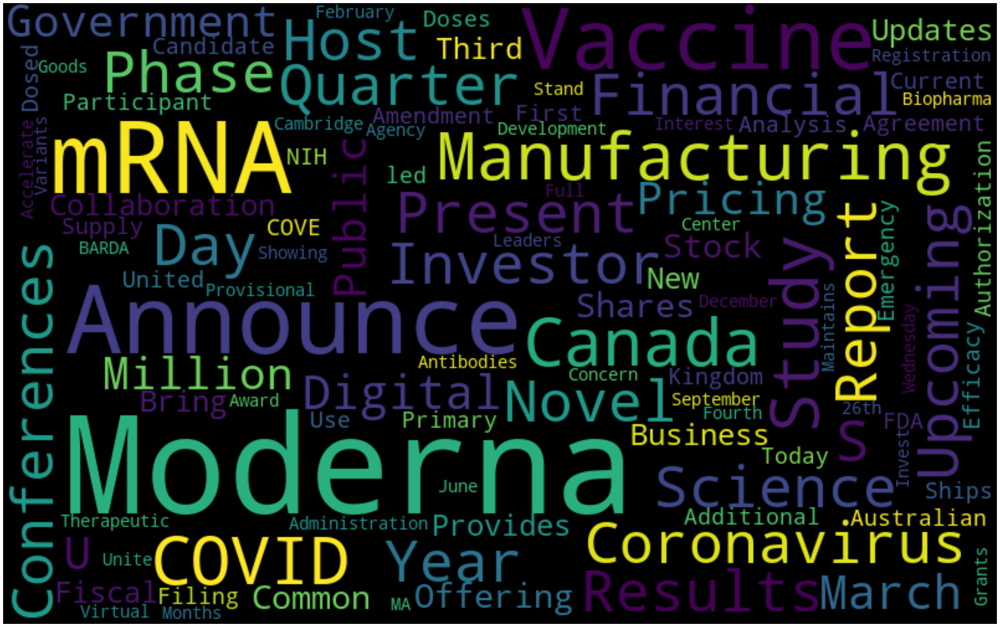

In [126]:
# Plot a cloud of words for titles
all_words = ' '.join([text for text in published_titles])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,collocations=False).generate(all_words)
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [127]:
headlines = dict()

for x in range(0, len(published_dates)):
    if published_dates[x] not in headlines:
        headlines[published_dates[x]] = list()

for x in range(0, len(published_dates)):
    if published_titles[x] not in headlines[published_dates[x]]:
        headlines[published_dates[x]].append(published_titles[x])

In [128]:
headlines

{'February 25, 2020': ['Moderna Ships mRNA Vaccine Against Novel Coronavirus (mRNA-1273) for Phase 1 Study'],
 'February 26, 2020': ['Moderna to Host Manufacturing & Digital Day on March 4, 2020'],
 'March 16, 2020': ['Moderna Announces First Participant Dosed in NIH-led Phase 1 Study of mRNA Vaccine (mRNA-1273) Against Novel Coronavirus'],
 'November 30, 2020': ['Moderna Announces Amendment to Current Supply Agreement with United Kingdom Government for an Additional 2 Million Doses of mRNA Vaccine Against COVID-19 (mRNA-1273)',
  'Moderna Announces Primary Efficacy Analysis in Phase 3 COVE Study for Its COVID-19 Vaccine Candidate and Filing Today with U.S. FDA for Emergency Use Authorization'],
 'May 18, 2020': ['Moderna Announces Pricing of Public Offering of Shares of Common Stock'],
 'August 9, 2021': ['Australian Therapeutic Goods Administration Grants Provisional Registration for Moderna’s COVID-19 Vaccine'],
 'August 09, 2021': ['Moderna and Canada Announce Collaboration to Brin

### Twitter Scraping

#### Positive Twitter Before Scraping

In [83]:
Until_date_list_Pos_UC_Before = []
Since_date_list_Pos_UC_Before = []
Until_date_list_Pos_Before = []
Since_date_list_Pos_Before = []
tdu = 3
tds = 1



for date in moderna_pos_list:
    Until_date = date - timedelta(tdu)
    Until_date_list_Pos_UC_Before.append(Until_date)
for date in moderna_pos_list:
    Since_date = date - timedelta(tds)
    Since_date_list_Pos_UC_Before.append(Since_date)

for date in Until_date_list_Pos_UC_Before:
    date = str(date)
    date_clean = date[0:10]
    Until_date_list_Pos_Before.append(date_clean)
for date in Since_date_list_Pos_UC_Before:
    date = str(date)
    date_clean = date[0:10]
    Since_date_list_Pos_Before.append(date_clean)

In [84]:
hashtag = 'Moderna'
until = ' until:'
since = ' since:'
lang = ' lang:en'

pos_tweets_before = pd.DataFrame()

for Udate, Sdate in zip(Until_date_list_Pos_Before, Since_date_list_Pos_Before):
    BSearch = hashtag + until + Udate + since + Sdate + lang
    tweets = pd.DataFrame(itertools.islice(sntwitter.TwitterSearchScraper(BSearch).get_items(), 100))
    pos_tweets_before = pos_tweets_before.append(tweets)

In [85]:
pos_tweets_before = pos_tweets_before.reset_index(drop=True)
pos_tweets_before.to_csv('pos_tweetsB')

#### Positive Twitter After Scraping

In [630]:
Until_date_list_Pos_UC_After = []
Since_date_list_Pos_UC_After = []
Until_date_list_Pos_After = []
Since_date_list_Pos_After = []
td = 2

for date in moderna_pos_list:
    Until_date = date + timedelta(td)
    Until_date_list_Pos_UC_After.append(Until_date)
for date in moderna_pos_list:
    Since_date_list_Pos_UC_After.append(date)
for date in Until_date_list_Pos_UC_After:
    date = str(date)
    date_clean = date[0:10]
    Until_date_list_Pos_After.append(date_clean)
for date in Since_date_list_Pos_UC_After:
    date = str(date)
    date_clean = date[0:10]
    Since_date_list_Pos_After.append(date_clean)

In [632]:
hashtag = 'Moderna'
until = ' until:'
since = ' since:'
lang = ' lang:en'

pos_tweets_after = pd.DataFrame()

for Udate, Sdate in zip(Until_date_list_Pos_After, Since_date_list_Pos_After):
    ASearch = hashtag + until + Udate + since + Sdate + lang
    tweets = pd.DataFrame(itertools.islice(sntwitter.TwitterSearchScraper(Search).get_items(), 100))
    pos_tweets_after = pos_tweets_after.append(tweets)

In [ ]:
pos_tweets_after = pos_tweets_after.reset_index(drop=True)
pos_tweets_after.to_csv('pos_tweetsA')

#### Negative Twitter Before Scraping

In [638]:
Until_date_list_Neg_UC_Before = []
Since_date_list_Neg_UC_Before = []
Until_date_list_Neg_Before = []
Since_date_list_Neg_Before = []

tdu = 3
tds = 1

for date in moderna_neg_list:
    Until_date = date - timedelta(tdu)
    Until_date_list_Neg_UC_Before.append(Until_date)
for date in moderna_neg_list:
    Since_date = date - timedelta(tds)
    Since_date_list_Neg_UC_Before.append(Since_date)

for date in Until_date_list_Neg_UC_Before:
    date = str(date)
    date_clean = date[0:10]
    Until_date_list_Neg_Before.append(date_clean)
for date in Since_date_list_Neg_UC_Before:
    date = str(date)
    date_clean = date[0:10]
    Since_date_list_Neg_Before.append(date_clean)

In [639]:
hashtag = 'Moderna'
until = ' until:'
since = ' since:'
lang = ' lang:en'

neg_tweets_before = pd.DataFrame()

for Udate,Sdate in zip(Until_date_list_Neg_Before,Since_date_list_Neg_Before):
    BSearch = hashtag + until + Udate + since + Sdate + lang
    tweets = pd.DataFrame(itertools.islice(sntwitter.TwitterSearchScraper(Search).get_items(), 100))
    neg_tweets_before = neg_tweets_before.append(tweets)

In [640]:
neg_tweets_before = neg_tweets_before.reset_index(drop=True)
neg_tweets_before.to_csv('neg_tweetsB')

#### Negative Twitter After Scraping

In [644]:
Until_date_list_Neg_UC_After = []
Since_date_list_Neg_UC_After = []
Until_date_list_Neg_After = []
Since_date_list_Neg_After = []

td = 2

for date in moderna_neg_list:
    Until_date = date + timedelta(td)
    Until_date_list_Neg_UC_After.append(Until_date)
for date in moderna_neg_list:
    Since_date_list_Neg_UC_After.append(date)

for date in Until_date_list_Neg_UC_After:
    date = str(date)
    date_clean = date[0:10]
    Until_date_list_Neg_After.append(date_clean)
for date in Since_date_list_Neg_UC_After:
    date = str(date)
    date_clean = date[0:10]
    Since_date_list_Neg_After.append(date_clean)

In [645]:
hashtag = 'Moderna'
until = ' until:'
since = ' since:'
lang = ' lang:en'

neg_tweets_after = pd.DataFrame()

for Udate,Sdate in zip(Until_date_list_Neg_After,Since_date_list_Neg_After):
    ASearch = hashtag + until + Udate + since + Sdate + lang
    tweets = pd.DataFrame(itertools.islice(sntwitter.TwitterSearchScraper(Search).get_items(), 100))
    neg_tweets_after = neg_tweets_after.append(tweets)

In [647]:
neg_tweets_after = neg_tweets_after.reset_index(drop=True)
neg_tweets_after.to_csv('neg_tweetsA')

### Cleaning Tweets

#### Cleaning Positive Before Tweets

In [7]:
pos_tweets_before = pd.read_csv('pos_tweets_before2')
before_pos_tweets = pos_tweets_before.drop(columns = ['url', 'id', 'outlinks', 'outlinksss', 'tcooutlinks', 'tcooutlinksss'])

# create new column
before_pos_tweets['tidy_tweet'] = before_pos_tweets['content']

#make tweets in lower case
before_pos_tweets['tidy_tweet'] = before_pos_tweets['tidy_tweet'] .str.lower()

#remove stopwords
stopwordlist = ['a', 'about', 'above', 'after', 'again', 'ain', 'all', 'am', 'an',
             'and','any','are', 'as', 'at', 'be', 'because', 'been', 'before',
             'being', 'below', 'between','both', 'by', 'can', 'd', 'did', 'do',
             'does', 'doing', 'down', 'during', 'each','few', 'for', 'from',
             'further', 'had', 'has', 'have', 'having', 'he', 'her', 'here',
             'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in',
             'into','is', 'it', 'its', 'itself', 'just', 'll', 'm', 'ma',
             'me', 'more', 'most','my', 'myself', 'now', 'o', 'of', 'on', 'once',
             'only', 'or', 'other', 'our', 'ours','ourselves', 'out', 'own', 're','s', 
            'same', 'she', "shes", 'should', "shouldve",'so', 'some', 'such',
             't', 'than', 'that', "thatll", 'the', 'their', 'theirs', 'them',
             'themselves', 'then', 'there', 'these', 'they', 'this', 'those',
             'through', 'to', 'too','under', 'until', 'up', 've', 'very', 'was',
             'we', 'were', 'what', 'when', 'where','which','while', 'who', 'whom',
             'why', 'will', 'with', 'won', 'y', 'you', "youd","youll", "youre",
             "youve", 'your', 'yours', 'yourself', 'yourselves']
STOPWORDS = set(stopwordlist)
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])
before_pos_tweets['tidy_tweet'] = before_pos_tweets['tidy_tweet'].apply(lambda text: cleaning_stopwords(text))

#remove emojis
emojis = {':)': 'smile', ':-)': 'smile', ';d': 'wink', ':-E': 'vampire', ':(': 'sad', 
          ':-(': 'sad', ':-<': 'sad', ':P': 'raspberry', ':O': 'surprised',
          ':-@': 'shocked', ':@': 'shocked',':-$': 'confused', ':\\': 'annoyed', 
          ':#': 'mute', ':X': 'mute', ':^)': 'smile', ':-&': 'confused', '$_$': 'greedy',
          '@@': 'eyeroll', ':-!': 'confused', ':-D': 'smile', ':-0': 'yell', 'O.o': 'confused',
          '<(-_-)>': 'robot', 'd[-_-]b': 'dj', ":'-)": 'sadsmile', ';)': 'wink', 
          ';-)': 'wink', 'O:-)': 'angel','O*-)': 'angel','(:-D': 'gossip', '=^.^=': 'cat'}
for emoji in emojis.keys():
    before_pos_tweets['tidy_tweet'] = before_pos_tweets['tidy_tweet'].replace(emoji, "EMOJI" + emojis[emoji])  

# remove @user
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt 
before_pos_tweets['tidy_tweet'] = np.vectorize(remove_pattern)(before_pos_tweets['tidy_tweet'] , "@[\w]*")

# remove URLs
def cleaning_URLs(data):
    return re.sub('((www.[^s]+)|(https?://[^s]+))',' ',data)
before_pos_tweets['tidy_tweet'] = before_pos_tweets['tidy_tweet'].apply(lambda x: cleaning_URLs(x))

# remove punctuations
english_punctuations = string.punctuation
punctuations_list = english_punctuations
def cleaning_punctuations(text):
    translator = str.maketrans('', '', punctuations_list)
    return text.translate(translator)
before_pos_tweets['tidy_tweet']= before_pos_tweets['tidy_tweet'].apply(lambda x: cleaning_punctuations(x))

# remove repeating characters
def cleaning_repeating_char(text):
    return re.sub(r'(.)1+', r'1', text)
before_pos_tweets['tidy_tweet'] = before_pos_tweets['tidy_tweet'].apply(lambda x: cleaning_repeating_char(x))

#remove special characters, numbers, punctuations
before_pos_tweets['tidy_tweet'] = before_pos_tweets['tidy_tweet'].replace(r'\D+','',regex=False)

# remove short words
before_pos_tweets['tidy_tweet'] = before_pos_tweets['tidy_tweet'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

# Tokenization, steaming, detokenization
tokenized_tweet = before_pos_tweets['tidy_tweet'].apply(lambda x: x.split())
detokenizer = MosesDetokenizer()
for i in range(len(tokenized_tweet)):
    tokenized_tweet[i] = detokenizer.detokenize(tokenized_tweet[i], return_str=True)
before_pos_tweets['tidy_tweet'] = tokenized_tweet

#### Cleaning Positive After Tweets

In [8]:
pos_tweets_after = pd.read_csv('pos_tweetsA')
after_pos_tweets = pos_tweets_after.drop(columns = ['url', 'id', 'outlinks', 'outlinksss', 'tcooutlinks', 'tcooutlinksss'])
# create new column
after_pos_tweets['tidy_tweet'] =after_pos_tweets['content']

#make tweets in lower case
after_pos_tweets['tidy_tweet'] = after_pos_tweets['tidy_tweet'] .str.lower()

#remove stopwords
STOPWORDS = set(stopwordlist)
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])
after_pos_tweets['tidy_tweet'] = after_pos_tweets['tidy_tweet'].apply(lambda text: cleaning_stopwords(text))

#remove emojis
for emoji in emojis.keys():
    after_pos_tweets['tidy_tweet'] = after_pos_tweets['tidy_tweet'].replace(emoji, "EMOJI" + emojis[emoji])  

# remove @user
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt 
after_pos_tweets['tidy_tweet'] = np.vectorize(remove_pattern)(after_pos_tweets['tidy_tweet'], "@[\w]*")

# remove URLs
def cleaning_URLs(data):
    return re.sub('((www.[^s]+)|(https?://[^s]+))',' ',data)
after_pos_tweets['tidy_tweet'] = after_pos_tweets['tidy_tweet'].apply(lambda x: cleaning_URLs(x))

# remove punctuations
english_punctuations = string.punctuation
punctuations_list = english_punctuations
def cleaning_punctuations(text):
    translator = str.maketrans('', '', punctuations_list)
    return text.translate(translator)
after_pos_tweets['tidy_tweet']= after_pos_tweets['tidy_tweet'].apply(lambda x: cleaning_punctuations(x))

# remove repeating characters
def cleaning_repeating_char(text):
    return re.sub(r'(.)1+', r'1', text)
after_pos_tweets['tidy_tweet'] = after_pos_tweets['tidy_tweet'].apply(lambda x: cleaning_repeating_char(x))

#remove special characters, numbers, punctuations
after_pos_tweets['tidy_tweet'] = after_pos_tweets['tidy_tweet'].replace(r'\D+','',regex=False)

# remove short words
after_pos_tweets['tidy_tweet'] = after_pos_tweets['tidy_tweet'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

# Tokenization, steaming, detokenization
tokenized_tweet = after_pos_tweets['tidy_tweet'].apply(lambda x: x.split())
detokenizer = MosesDetokenizer()
for i in range(len(tokenized_tweet)):
    tokenized_tweet[i] = detokenizer.detokenize(tokenized_tweet[i], return_str=True)
after_pos_tweets['tidy_tweet'] = tokenized_tweet

#### Cleaning Negative Before Tweets

In [9]:
neg_tweets_before = pd.read_csv('neg_tweets_before')
before_neg_tweets = neg_tweets_before.drop(columns = ['url', 'id', 'outlinks', 'outlinksss', 'tcooutlinks', 'tcooutlinksss'])

# create new column
before_neg_tweets['tidy_tweet'] =before_neg_tweets['content']

#make tweets in lower case
before_neg_tweets['tidy_tweet'] = before_neg_tweets['tidy_tweet'] .str.lower()

#remove stopwords
STOPWORDS = set(stopwordlist)
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])
before_neg_tweets['tidy_tweet'] = before_neg_tweets['tidy_tweet'].apply(lambda text: cleaning_stopwords(text))

#remove emojis
for emoji in emojis.keys():
    before_neg_tweets['tidy_tweet'] = before_neg_tweets['tidy_tweet'].replace(emoji, "EMOJI" + emojis[emoji])  

# remove @user
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt 
before_neg_tweets['tidy_tweet'] = np.vectorize(remove_pattern)(before_neg_tweets['tidy_tweet'], "@[\w]*")

# remove URLs
def cleaning_URLs(data):
    return re.sub('((www.[^s]+)|(https?://[^s]+))',' ',data)
before_neg_tweets['tidy_tweet'] = before_neg_tweets['tidy_tweet'].apply(lambda x: cleaning_URLs(x))

# remove punctuations
english_punctuations = string.punctuation
punctuations_list = english_punctuations
def cleaning_punctuations(text):
    translator = str.maketrans('', '', punctuations_list)
    return text.translate(translator)
before_neg_tweets['tidy_tweet']= before_neg_tweets['tidy_tweet'].apply(lambda x: cleaning_punctuations(x))

# remove repeating characters
def cleaning_repeating_char(text):
    return re.sub(r'(.)1+', r'1', text)
before_neg_tweets['tidy_tweet'] = before_neg_tweets['tidy_tweet'].apply(lambda x: cleaning_repeating_char(x))

#remove special characters, numbers, punctuations
before_neg_tweets['tidy_tweet'] = before_neg_tweets['tidy_tweet'].replace(r'\D+','',regex=False)

# remove short words
before_neg_tweets['tidy_tweet'] = before_neg_tweets['tidy_tweet'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

# Tokenization, steaming, detokenization
tokenized_tweet = before_neg_tweets['tidy_tweet'].apply(lambda x: x.split())
detokenizer = MosesDetokenizer()
for i in range(len(tokenized_tweet)):
    tokenized_tweet[i] = detokenizer.detokenize(tokenized_tweet[i], return_str=True)
before_neg_tweets['tidy_tweet'] = tokenized_tweet

#### Cleaning Negative After Tweets

In [10]:
neg_tweets_after = pd.read_csv('neg_tweets_after')
after_neg_tweets = neg_tweets_after.drop(columns = ['url', 'id', 'outlinks', 'outlinksss', 'tcooutlinks', 'tcooutlinksss'])

# create new column
after_neg_tweets['tidy_tweet'] = after_neg_tweets['content']

#make tweets in lower case
after_neg_tweets['tidy_tweet'] = after_neg_tweets['tidy_tweet'] .str.lower()

#remove stopwords
STOPWORDS = set(stopwordlist)
def cleaning_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])
after_neg_tweets['tidy_tweet'] = after_neg_tweets['tidy_tweet'].apply(lambda text: cleaning_stopwords(text))

#remove emojis
for emoji in emojis.keys():
    after_neg_tweets['tidy_tweet'] = after_neg_tweets['tidy_tweet'].replace(emoji, "EMOJI" + emojis[emoji])  

# remove @user
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt 
after_neg_tweets['tidy_tweet'] = np.vectorize(remove_pattern)(after_neg_tweets['tidy_tweet'], "@[\w]*")

# remove URLs
def cleaning_URLs(data):
    return re.sub('((www.[^s]+)|(https?://[^s]+))',' ',data)
after_neg_tweets['tidy_tweet'] = after_neg_tweets['tidy_tweet'].apply(lambda x: cleaning_URLs(x))

# remove punctuations
english_punctuations = string.punctuation
punctuations_list = english_punctuations
def cleaning_punctuations(text):
    translator = str.maketrans('', '', punctuations_list)
    return text.translate(translator)
after_neg_tweets['tidy_tweet']= after_neg_tweets['tidy_tweet'].apply(lambda x: cleaning_punctuations(x))

# remove repeating characters
def cleaning_repeating_char(text):
    return re.sub(r'(.)1+', r'1', text)
after_neg_tweets['tidy_tweet'] = after_neg_tweets['tidy_tweet'].apply(lambda x: cleaning_repeating_char(x))

#remove special characters, numbers, punctuations
after_neg_tweets['tidy_tweet'] = after_neg_tweets['tidy_tweet'].replace(r'\D+','',regex=False)

# remove short words
after_neg_tweets['tidy_tweet'] = after_neg_tweets['tidy_tweet'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

# Tokenization, steaming, detokenization
tokenized_tweet = after_neg_tweets['tidy_tweet'].apply(lambda x: x.split())
detokenizer = MosesDetokenizer()
for i in range(len(tokenized_tweet)):
    tokenized_tweet[i] = detokenizer.detokenize(tokenized_tweet[i], return_str=True)
after_neg_tweets['tidy_tweet'] = tokenized_tweet

### Text Visualization

#### Before Positive Tweets Visualization

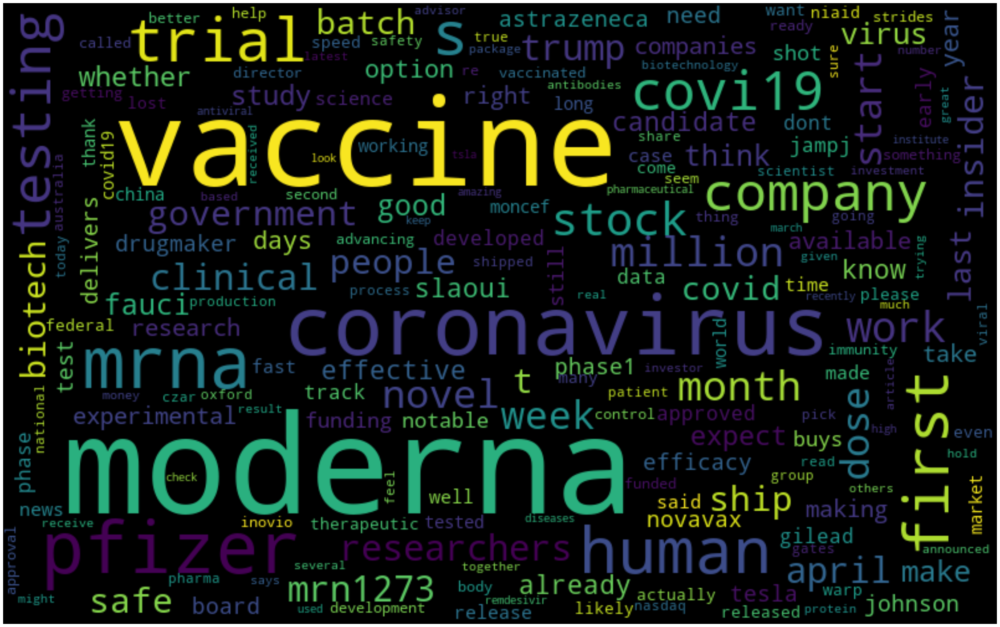

In [11]:
all_words = ' '.join([text for text in before_pos_tweets['tidy_tweet']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,collocations=False).generate(all_words)
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

#### After Positive Tweets Visualization

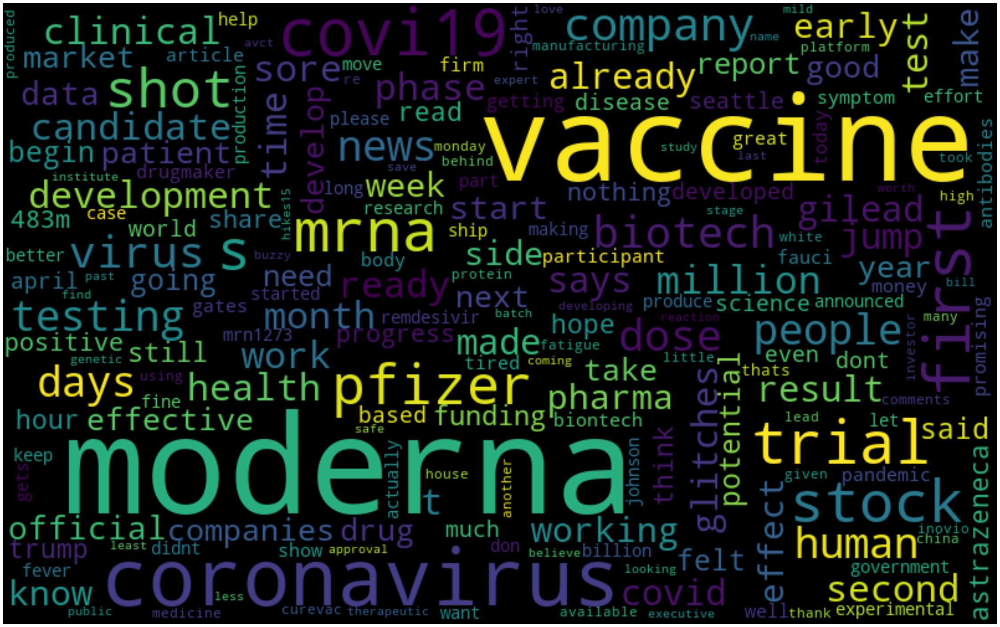

In [12]:
all_words = ' '.join([text for text in after_pos_tweets['tidy_tweet']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,collocations=False).generate(all_words)
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

#### Before Negative Tweets Visualization

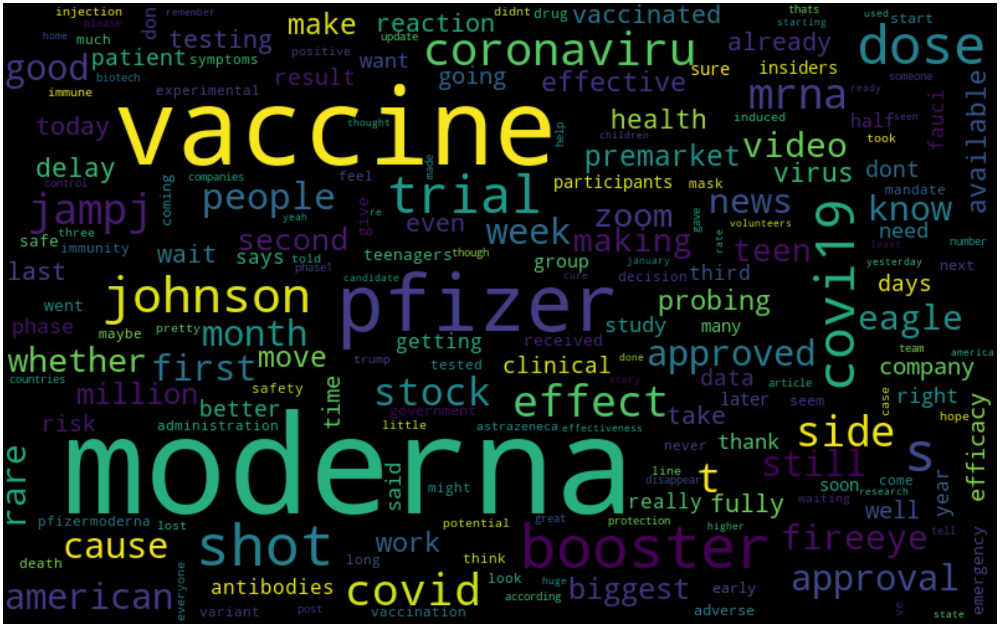

In [13]:
all_words = ' '.join([text for text in before_neg_tweets['tidy_tweet']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,collocations=False).generate(all_words)
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

#### After Negative Tweets Visualization

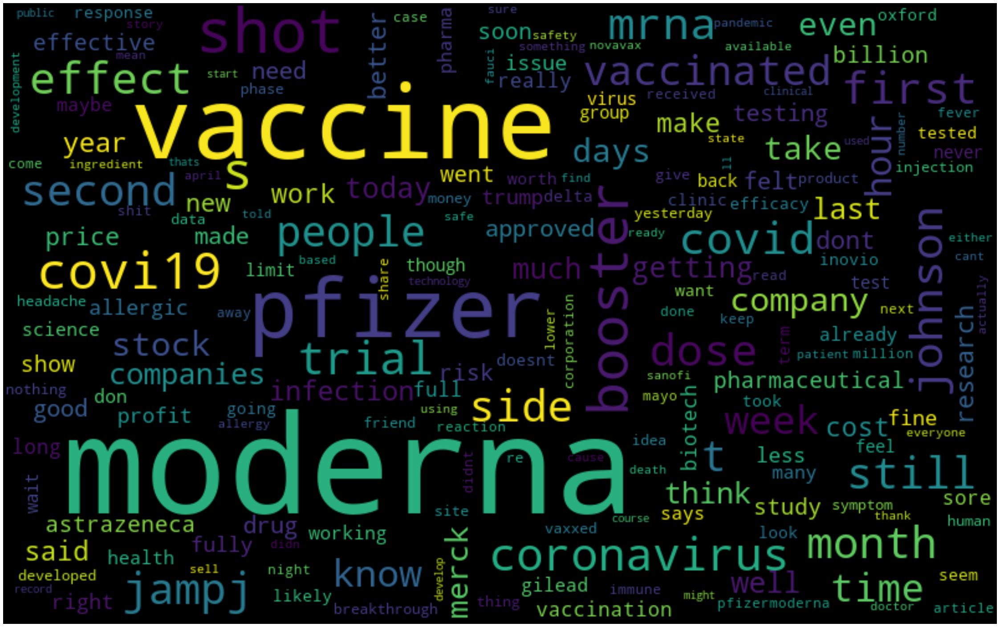

In [14]:
all_words = ' '.join([text for text in after_neg_tweets['tidy_tweet']])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110,collocations=False).generate(all_words)
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

### Sentiment Analysis

#### Postive Tweets Before Sentiment Analysis (Vader)

In [119]:
before_pos_tweets['scores'] = before_pos_tweets['tidy_tweet'].apply(lambda Description: sid.polarity_scores(Description))
before_pos_tweets['compound'] = before_pos_tweets['scores'].apply(lambda score_dict: score_dict['compound'])
before_pos_tweets['sentiment_type']=''
before_pos_tweets.loc[before_pos_tweets.compound>0,'sentiment_type']='POSITIVE'
before_pos_tweets.loc[before_pos_tweets.compound==0,'sentiment_type']='NEUTRAL'
before_pos_tweets.loc[before_pos_tweets.compound<0,'sentiment_type']='NEGATIVE'

#### Postive Tweets Before Sentiment Analysis (Textblob)

In [120]:
for tweet in before_pos_tweets:
    blob = TextBlob(tweet)

    for sentence in blob.sentences:
        before_pos_tweets['polarity'] = before_pos_tweets['tidy_tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)
        before_pos_tweets['subjectivity'] = before_pos_tweets['tidy_tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)

before_pos_tweets.head()

,Unnamed: 0,date,content,username,tidy_tweet,scores,compound,sentiment_type,polarity,subjectivity
0,0,2020-02-23 23:28:04+00:00,"Notable Insider Buys Last Week: Moderna, Tesla...",rwmholdings,notable insider buys last week moderna tesla s...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.00,NEUTRAL,0.250000,0.283333
1,1,2020-02-23 23:21:29+00:00,"$TSLA Notable Insider Buys Last Week: Moderna,...",boukman2004,tsla notable insider buys last week moderna tesla,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.00,NEUTRAL,0.250000,0.283333
2,2,2020-02-23 23:16:34+00:00,"Notable Insider Buys Last Week: Moderna, Tesla...",boukman2004,notable insider buys last week moderna tesla,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.00,NEUTRAL,0.250000,0.283333
3,3,2020-02-23 22:50:47+00:00,@Public_Citizen This article is crap!\nBiotech...,cooltagged,article crap biotech companies like moderna ph...,"{'neg': 0.138, 'neu': 0.69, 'pos': 0.172, 'com...",0.25,POSITIVE,-0.545833,0.670833
4,4,2020-02-23 22:26:38+00:00,"Notable Insider Buys Last Week: Moderna, Tesla...",voiceofthehwy,notable insider buys last week moderna tesla,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.00,NEUTRAL,0.250000,0.283333


In [121]:
print(before_pos_tweets.sentiment_type.value_counts())
print(before_pos_tweets.sentiment_type.value_counts(normalize=True))

POSITIVE    261
NEUTRAL     200
NEGATIVE     85
Name: sentiment_type, dtype: int64
POSITIVE    0.478022
NEUTRAL     0.366300
NEGATIVE    0.155678
Name: sentiment_type, dtype: float64


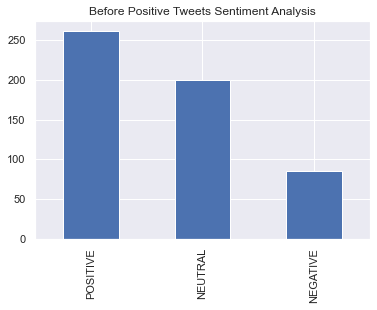

In [122]:
before_pos_tweets.sentiment_type.value_counts().plot(kind='bar',title="Before Positive Tweets Sentiment Analysis");

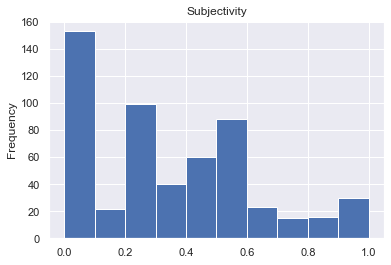

In [89]:
before_pos_tweets.subjectivity.plot(kind='hist',title="Subjectivity");

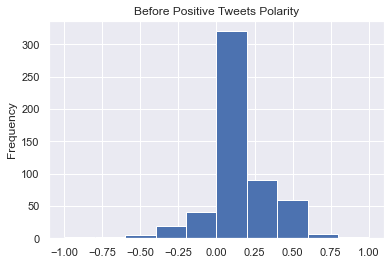

In [123]:
before_pos_tweets.polarity.plot(kind='hist',title="Before Positive Tweets Polarity");

In [124]:
px.density_heatmap(before_pos_tweets[['polarity','subjectivity']], x="polarity", y="subjectivity", marginal_x="violin", marginal_y="histogram").update_layout(yaxis = dict(scaleanchor = 'x'))

In [152]:
px.violin(before_pos_tweets[['polarity','subjectivity']], points = 'all', box = True)

#### Postive Tweets After Sentiment Analysis (Vader)

In [125]:
after_pos_tweets['scores'] = after_pos_tweets['tidy_tweet'].apply(lambda Description: sid.polarity_scores(Description))
after_pos_tweets['compound'] = after_pos_tweets['scores'].apply(lambda score_dict: score_dict['compound'])
after_pos_tweets['sentiment_type']=''
after_pos_tweets.loc[after_pos_tweets.compound>0,'sentiment_type']='POSITIVE'
after_pos_tweets.loc[after_pos_tweets.compound==0,'sentiment_type']='NEUTRAL'
after_pos_tweets.loc[after_pos_tweets.compound<0,'sentiment_type']='NEGATIVE'

#### Postive Tweets After Sentiment Analysis (Textblob)

In [126]:
for tweet in after_pos_tweets:
    blob = TextBlob(tweet)

    for sentence in blob.sentences:
        after_pos_tweets['polarity'] = after_pos_tweets['tidy_tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)
        after_pos_tweets['subjectivity'] = after_pos_tweets['tidy_tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)

In [127]:
print(after_pos_tweets.sentiment_type.value_counts())
print(after_pos_tweets.sentiment_type.value_counts(normalize=True))

POSITIVE    429
NEUTRAL     347
NEGATIVE    203
Name: sentiment_type, dtype: int64
POSITIVE    0.438202
NEUTRAL     0.354443
NEGATIVE    0.207354
Name: sentiment_type, dtype: float64


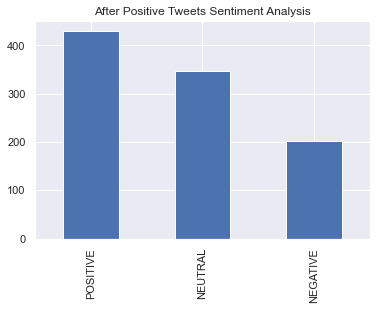

In [128]:
after_pos_tweets.sentiment_type.value_counts().plot(kind='bar',title="After Positive Tweets Sentiment Analysis");

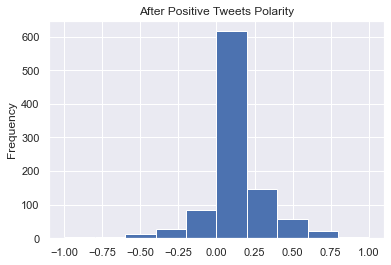

In [129]:
after_pos_tweets.polarity.plot(kind='hist',title="After Positive Tweets Polarity");

In [130]:
px.violin(after_pos_tweets[['polarity','subjectivity']], points = 'all', box = True)

#### Negative Tweets Before Sentiment Analysis (Vader)

In [131]:
before_neg_tweets['scores'] = before_neg_tweets['tidy_tweet'].apply(lambda Description: sid.polarity_scores(Description))
before_neg_tweets['compound'] = before_neg_tweets['scores'].apply(lambda score_dict: score_dict['compound'])
before_neg_tweets['sentiment_type']=''
before_neg_tweets.loc[before_neg_tweets.compound>0,'sentiment_type']='POSITIVE'
before_neg_tweets.loc[before_neg_tweets.compound==0,'sentiment_type']='NEUTRAL'
before_neg_tweets.loc[before_neg_tweets.compound<0,'sentiment_type']='NEGATIVE'

#### Negative Tweets Before Sentiment Analysis (Textblob)

In [132]:
for tweet in before_neg_tweets:
    blob = TextBlob(tweet)

    for sentence in blob.sentences:
        before_neg_tweets['polarity'] = before_neg_tweets['tidy_tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)
        before_neg_tweets['subjectivity'] = before_neg_tweets['tidy_tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)

before_neg_tweets.head()

,Unnamed: 0,date,content,username,tidy_tweet,scores,compound,sentiment_type,polarity,subjectivity
0,0,2020-03-05 23:54:48+00:00,Researchers in Seattle have begun recruiting h...,bridget123goooo,researchers seattle begun recruiting healthy v...,"{'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compou...",0.4019,POSITIVE,0.1625,0.400000
1,1,2020-03-05 23:43:31+00:00,@LeValleyKelly Add Vaxart and Moderna to whate...,Uwork4Who,vaxart moderna whatever list making,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,NEUTRAL,0.0000,0.000000
2,2,2020-03-05 23:43:19+00:00,@fezziwig2019 @SpeakerPelosi I must’ve halluci...,brendan_49,must’ve hallucinated moderna pump,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,NEUTRAL,0.0000,0.000000
3,3,2020-03-05 23:17:47+00:00,@michaelbatnick I bought moderna and gdlcf,TEN000000000,bought moderna gdlcf,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,NEUTRAL,0.0000,0.000000
4,4,2020-03-05 23:04:42+00:00,@thatsdatingnow There are already clinical tri...,EmotionallyBou1,already clinical trials though late moderna fi...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,NEUTRAL,-0.0250,0.466667


In [133]:
print(before_neg_tweets.sentiment_type.value_counts())
print(before_neg_tweets.sentiment_type.value_counts(normalize=True))

POSITIVE    333
NEUTRAL     230
NEGATIVE    137
Name: sentiment_type, dtype: int64
POSITIVE    0.475714
NEUTRAL     0.328571
NEGATIVE    0.195714
Name: sentiment_type, dtype: float64


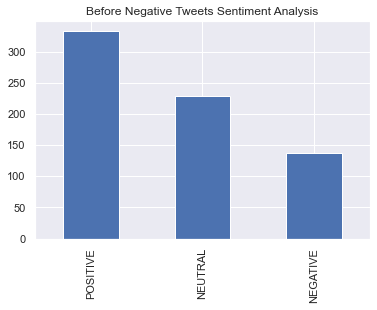

In [134]:
before_neg_tweets.sentiment_type.value_counts().plot(kind='bar',title="Before Negative Tweets Sentiment Analysis");

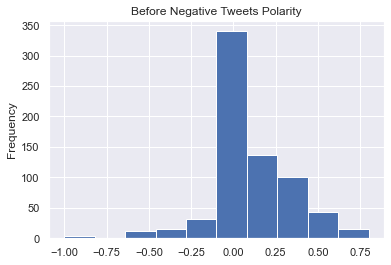

In [135]:
before_neg_tweets.polarity.plot(kind='hist',title="Before Negative Tweets Polarity");

In [145]:
px.violin(before_neg_tweets[['polarity','subjectivity']], points = 'all', box = True)

In [136]:
px.density_heatmap(before_neg_tweets[['polarity','subjectivity']], x="polarity", y="subjectivity", marginal_x="violin", marginal_y="histogram").update_layout(yaxis = dict(scaleanchor = 'x'))

#### Negative Tweets After Sentiment Analysis (Vader)

In [137]:
after_neg_tweets['scores'] = after_neg_tweets['tidy_tweet'].apply(lambda Description: sid.polarity_scores(Description))
after_neg_tweets['compound'] = after_neg_tweets['scores'].apply(lambda score_dict: score_dict['compound'])
after_neg_tweets['sentiment_type']=''
after_neg_tweets.loc[after_neg_tweets.compound>0,'sentiment_type']='POSITIVE'
after_neg_tweets.loc[after_neg_tweets.compound==0,'sentiment_type']='NEUTRAL'
after_neg_tweets.loc[after_neg_tweets.compound<0,'sentiment_type']='NEGATIVE'

#### Negative Tweets After Sentiment Analysis (Textblob)

In [138]:
for tweet in after_neg_tweets:
    blob = TextBlob(tweet)

    for sentence in blob.sentences:
        after_neg_tweets['polarity'] = after_neg_tweets['tidy_tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)
        after_neg_tweets['subjectivity'] = after_neg_tweets['tidy_tweet'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)

In [139]:
print(after_neg_tweets.sentiment_type.value_counts())
print(after_neg_tweets.sentiment_type.value_counts(normalize=True))

POSITIVE    296
NEUTRAL     223
NEGATIVE    181
Name: sentiment_type, dtype: int64
POSITIVE    0.422857
NEUTRAL     0.318571
NEGATIVE    0.258571
Name: sentiment_type, dtype: float64


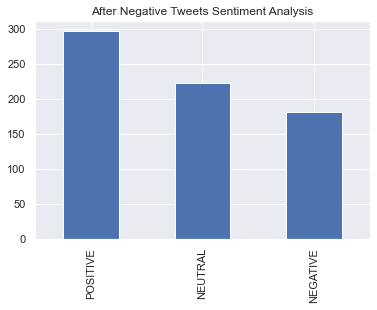

In [140]:
after_neg_tweets.sentiment_type.value_counts().plot(kind='bar',title="After Negative Tweets Sentiment Analysis");

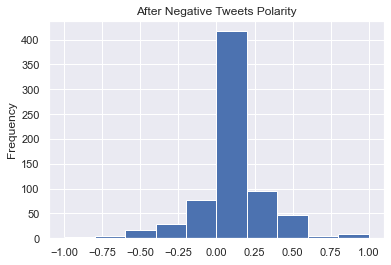

In [141]:
after_neg_tweets.polarity.plot(kind='hist',title="After Negative Tweets Polarity");

In [142]:
px.violin(after_neg_tweets[['polarity','subjectivity']], points = 'all', box = True)

### Results/Analysis Code

#### Polarity

In [143]:
print("Before Positive Tweets Polarity:", before_pos_tweets.polarity.mean())
print("After Positive Tweets Polarity:", after_pos_tweets.polarity.mean())
print("Before Negative Tweets Polarity:", before_neg_tweets.polarity.mean())
print("After Negative Tweets Polarity:", after_neg_tweets.polarity.mean())

Before Positive Tweets Polarity: 0.11748399583221024
After Positive Tweets Polarity: 0.08713259870915287
Before Negative Tweets Polarity: 0.09927827445372096
After Negative Tweets Polarity: 0.07414065141207997


#### Subjectivity

In [144]:
print("Before Positive Tweets Subjectivity:", before_pos_tweets.subjectivity.mean())
print("After Positive Tweets Subjectivity:", after_pos_tweets.subjectivity.mean())
print("Before Negative Tweets Subjectivity:", before_neg_tweets.subjectivity.mean())
print("After Negative Tweets Subjectivity:", after_neg_tweets.subjectivity.mean())

Before Positive Tweets Subjectivity: 0.3368690711845477
After Positive Tweets Subjectivity: 0.31502973495380115
Before Negative Tweets Subjectivity: 0.33398841001921387
After Negative Tweets Subjectivity: 0.3070123685507615
